## **Analysis of levels of solar radiation in Brisbane**
<author> &copy; Prepared by Oscar Mendoza Cerna

---

### 1. Summary <a name="question1"></a>

Solar radiation could has a positive or negative impact in the society. The latter may be considered as causation of serious illness in the population; namely, cancer disease. The positive impact may be related to the utilization of renewable energies instead of non-renewable energies.

The main objective of this report is to evaluate the impact of weather conditions in solar radiation. This evaluation might be useful to determine patterns, trends and predictions of solar radiation in the future. Solar radiation is measured in megajoules per square metre (MJ/m2), and it has a range between 1 and 35 MJ/m2. These values may be used to classify the levels of solar radiation in Brisbane; therefore, when there are highest levels, authorities can advise the population about the health risks. Moreover, highest solar radiation may be used as renewable energy. As such, this report focus in two stakeholder: enviromental and healt departmen authorities of Brisbane

This analysis has been carried out using weather data downloaded from [The Queensland government](https://www.longpaddock.qld.gov.au/) website. This data was taken over a period of three years (2019, 2020 and 2021) of the 40913 East Brisbane weather station located in the latitude= -27.4808, longitude= 153.0389 and elevation= 8.1 m. The technical analysis was performed utilizing exploratory, descriptive, and advanced techniques:

- Data was cleaned, removing useless variables. 
- Satistical analysis were utilised to verify the information of the data.
- Graphical visualization of time series of radiation throughout the three years was illustrated.
- Correlation matrix between all variables in order to select helpful variables.
- Classification of levels of solar radiation: low, moderate, high and extreme levels according to the quartiles of solar radiation
- Prediction of solar radiation using neural network.

The model of prediction has revealed some insights as the most important weather conditions that cause the increase of solar radiation, such as evapotranspiration and vaporización. Furthermore, it has been elaborated a risk of analysis in order to determine the problems of this model of prediction if it would be implemented in the real world. 


---
### 2. Description of the key question and problem space <a name="question2"></a>

#### Problem space (business concern):
A big problem can appear due to the increase of the amount of solar radiation. As it has previously mentioned, health and environment are currently of great concern to authorities. Hence, identification of levels of solar radiation, trends, months with highest radiation and prediction of radiation for the next years may enable to take proper and anticipated solutions due to highest level of radiation. 

#### Question: addressing stakeholders concerns
Patterns, trends and predictions of solar radiation in Brisbane, it can be the great importance for many stakeholders. Hence, the question may be defined as what are the characteristic, trends and prediction of level of solar radiation in Brisbane what can cause negative or positive impact in the society.

---
### 3. Description of the data analytics <a name="question3"></a>

This report has been performed following the data analysis cycle (QDAVI). As previously mentioned, the importance of determining the trends, predictions and levels of solar radiation in Brisbane may be pivotal to prevent serious illness and to take advantage of the energy generated for the radiation.

This data consists of weather features, for instances, rainfall, solar radiation, humidity, temperature. 

The analysis was performed utilising statistical and advanced techniques. First, the trends of solar radiation was determined throughout the years 2019, 2020 and 2021. Further, quartiles of solar radiation were used to classify the level of solar radiation in four groups:


|Description| Level    | Radiation (MJ/m2)    |
|-----------|----------|----------------------|
|Quartile 1 |Low       | <13.3                |
|Quartile 2 |Moderate  | >=13.3 & <17.4       |
|Quartile 3 |High      | >=17.4 & <22.4       |
|Quartile 4 |Extreme   | >=22.4               |

This classification allowed model to have a precise prediction of solar radiation. Then, the correlation of the variables was necessary to select the most relevant variable. The target variable `radiation` was compared with the other variables, selecting the correlation with greater and equal to +/-0.35. Afterwards, it was constructed the prediction model utilising neural network. Data was split in three sections: training, test and validation with 70%, 15% and 15% for each one, respectively.

Finally, it was obtained a model of prediction of the level of solar radiation. This analysis tried to answer of question following the QDAVI. Additionally, it could be identified the patterns and key feat of solar radiation as well as the most important features for the prediction of solar radiation.


---
### 4. Data Analytics Cycle <a name="question4"></a>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import lime
from lime import lime_tabular

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler,MinMaxScaler

# keras / deep learning libraries
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import model_from_json
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.utils import plot_model

# callbacks
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau

from sklearn.metrics import mean_squared_error, r2_score

from matplotlib import pyplot

sns.set()

%matplotlib inline

# Extend number of columns and rows
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)

#### 4.1 Question (interpretation)
The question asks to identify characteristics, patterns, trends and predictions of levels of solar radiation in Brisbane. First, the analysis will try to identify significant periods of radiation in Brisbane. Since the dataset consists of numerical values, it will be suit to use statistical techniques to obtain descriptive information per year and month. Then, utilizing advanced techniques is possible to elaborate a model of prediction which might help to predict the solar radiation in the next years.

The analysis may provide beneficial information for different stakeholders. The Department of Environment and Science in Queensland could be interested in it. Solar radiation may provide renewable energy. Therefore, this analysis could provide information about which months have the highest level of solar radiation in Brisbane in order to install solar panels. Also, the prediction of levels of solar radiation can enable to budget this investment. Business who implement this system of solar energy would be also curious about this analysis. However, they can take advantage and increase the price of this system if they know certain feature and prediction of solar radiation. Another important part is health care. Most citizens may be no interest in this kind of prediction, but authorities can use this prediction to advise them if there are some extreme solar radiations that can cause them cancer or other kind of disease. Hence, this question and further analysis may be beneficial for two clear purposes: health and environmental care.


#### 4.2 Dataset

At the beginning, this dataset had 39 variables, but after cleaning and removing some unimportant variables, the dataset was fixed in 20 attributes. The following table shows the description of these last features:

| Feature                   | Description                                                                                  |
|---------------------------|----------------------------------------------------------------------------------------------|
| station                   | per capita crime rate by town                                                                |
| YYYY-MM-DD                | proportion of residential land zoned for lots over 25,000 sq.ft.                             |
| daily_rain                | Daily rainfall (mm)                                                                          |
| max_temp                  | Maximum temperature (°C)                                                                     |
| min_temp                  | Minimum temperature (°C)                                                                     |
| vp                        | Vapour pressure (hPa)                                                                        |
| vp_deficit                | Vapour pressure deficit (hPa)                                                                |
| evap_pan                  | Evaporation - Class A pan (mm)                                                               |
| evap_syn                  | Evaporation - synthetic estimate (mm)                                                        |
| evap_comb                 | Evaporation - combination (synthetic estimate pre-1970, class A pan 1970 onwards) (mm)       |
| evap_morton_lake          | Evaporation - Morton's shallow lake evaporation (mm)                                         |
| radiation                 | Solar radiation - total incoming downward shortwave radiation on a horizontal surface (MJ/m2)|
| rh_tmax                   | Relative humidity at the time of maximum temperature (%)                                     |
| rh_tmin                   | Relative humidity at the time of minimum temperature (%)                                     |
| et_short_crop             | Evapotranspiration - FAO56 short crop (mm)                                                   |
| et_tall_crop              | Evapotranspiration - ASCE tall crop (mm)                                                     |
| et_morton_actual          | Evapotranspiration - Morton's areal actual evapotranspiration (mm)                           |
| et_morton_potential       | Evapotranspiration - Morton's potential evapotranspiration (mm)                              |
| et_morton_wet             | Evapotranspiration - Morton's wet-environment areal evapotranspiration over land (mm)        |
| mslp                      | Mean sea level pressure (hPa)                                                                |

In [3]:
# Import the data
df_Br = pd.read_csv('40913.csv', )

**Clean/prepare the data for analysis**


In [4]:
df_Br.head(10)

,station,YYYY-MM-DD,daily_rain,daily_rain_source,max_temp,max_temp_source,min_temp,min_temp_source,vp,vp_source,vp_deficit,vp_deficit_source,evap_pan,evap_pan_source,evap_syn,evap_syn_source,evap_comb,evap_comb_source,evap_morton_lake,evap_morton_lake_source,radiation,radiation_source,rh_tmax,rh_tmax_source,rh_tmin,rh_tmin_source,et_short_crop,et_short_crop_source,et_tall_crop,et_tall_crop_source,et_morton_actual,et_morton_actual_source,et_morton_potential,et_morton_potential_source,et_morton_wet,et_morton_wet_source,mslp,mslp_source,metadata
0,40913,2010-01-01,1.4,0,29.6,0,23.6,0,22.2,0,15.8,26,5.1,25,5.8,26,5.1,25,5.7,26,19.5,25,53.5,26,76.2,26,5.0,26,6.2,26,3.6,26,7.5,26,5.6,26,1016.0,0,name=BRISBANE
1,40913,2010-01-02,0.8,0,30.8,0,23.9,0,24.4,0,15.8,26,6.9,25,6.6,26,6.9,25,7.0,26,24.5,25,54.9,26,82.3,26,5.7,26,6.8,26,5.5,26,8.3,26,6.9,26,1012.5,0,latitude= -27.4808
2,40913,2010-01-03,0.0,0,32.2,0,24.9,0,27.6,0,15.7,26,4.2,25,5.1,26,4.2,25,4.9,26,15.0,25,57.4,26,87.7,26,4.3,26,5.3,26,3.3,26,6.3,26,4.8,26,1010.7,0,longitude= 153.0389
3,40913,2010-01-04,20.6,0,27.7,0,23.4,0,23.8,0,11.1,26,4.4,25,3.4,26,4.4,25,2.6,26,7.9,25,64.1,26,82.7,26,2.8,26,3.7,26,1.1,26,4.1,26,2.6,26,1015.8,0,elevation= 8.1 m
4,40913,2010-01-05,0.0,0,27.8,0,21.1,0,21.7,0,12.2,26,3.9,25,4.4,26,3.9,25,4.1,26,13.9,25,58.1,26,86.8,26,3.7,26,4.6,26,2.7,26,5.5,26,4.1,26,1017.3,0,reference=RXNVDESCLJHGFTAPWM
5,40913,2010-01-06,0.0,0,29.3,0,21.8,0,25.2,0,11.3,26,4.0,25,4.9,26,4.0,25,5.1,26,17.1,25,61.8,26,96.5,26,4.1,26,4.8,26,4.4,26,5.7,26,5.0,26,1015.5,0,extracted=20220528
6,40913,2010-01-07,0.6,0,28.6,0,22.4,0,25.8,0,10.0,26,4.6,25,4.2,26,4.6,25,4.4,26,14.4,25,65.9,26,95.3,26,3.5,26,4.2,26,3.7,26,5.0,26,4.3,26,1014.8,0,Please read our web site for information about...
7,40913,2010-01-08,0.2,0,30.3,0,22.3,0,22.0,0,16.5,26,5.0,25,5.8,26,5.0,25,5.5,26,18.8,25,51.0,26,81.7,26,4.9,26,6.1,26,3.5,26,7.2,26,5.4,26,1017.6,0,NaN
8,40913,2010-01-09,0.0,0,30.2,0,21.7,0,24.7,0,13.3,26,7.1,25,6.8,26,7.1,25,7.8,26,28.1,25,57.6,26,95.2,26,5.9,26,6.7,26,7.1,26,8.1,26,7.6,26,1019.2,0,NaN
9,40913,2010-01-10,0.0,0,30.6,0,21.0,0,22.2,0,16.0,26,7.1,25,7.4,26,7.1,25,8.1,26,29.6,25,50.6,26,89.3,26,6.3,26,7.4,26,6.8,26,8.9,26,7.8,26,1017.7,0,NaN


Looking the above table can be concluded the following:
- Columns named `_source` are unary variable. Therefore, because the values are same, it will not cause any change in the outcome of analysis.
- `station` variable is also unary variable which display the number of rainfall station.
- `metadata` variable shows information of rainfall station, such as localization and name.

Therefore, these variables will be dropped because they are not important for this analysis.

In [4]:
# Drop unnecessary variables
df_Brisbane = df_Br.drop(['station','daily_rain_source', 'max_temp_source','min_temp_source','vp_source','mslp_source','vp_deficit_source','evap_pan_source','evap_syn_source','evap_comb_source',
             'evap_morton_lake_source','radiation_source','rh_tmax_source','rh_tmin_source','et_short_crop_source','et_tall_crop_source','et_morton_actual_source','et_morton_potential_source',
              'et_morton_wet_source','metadata'],axis=1)

df_Brisbane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4523 entries, 0 to 4522
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   YYYY-MM-DD           4523 non-null   object 
 1   daily_rain           4523 non-null   float64
 2   max_temp             4523 non-null   float64
 3   min_temp             4523 non-null   float64
 4   vp                   4523 non-null   float64
 5   vp_deficit           4523 non-null   float64
 6   evap_pan             4523 non-null   float64
 7   evap_syn             4523 non-null   float64
 8   evap_comb            4523 non-null   float64
 9   evap_morton_lake     4523 non-null   float64
 10  radiation            4523 non-null   float64
 11  rh_tmax              4523 non-null   float64
 12  rh_tmin              4523 non-null   float64
 13  et_short_crop        4523 non-null   float64
 14  et_tall_crop         4523 non-null   float64
 15  et_morton_actual     4523 non-null   f

- According to the function `info`, the variable `YYYY-MM-DD` is object, which is incorrect. Therefore, it will be modified to `date` and also, it will be renamed.
- Then, the variable `date` will be split into year and month to allow a further analysis.
- Select period of analysis: between 2019-2021 (3 years)

In [5]:
# Modify data type (variable date)
df_Brisbane['YYYY-MM-DD'] = pd.to_datetime(df_Brisbane['YYYY-MM-DD'], dayfirst=True)

# Rename date column
df_Brisbane.rename(columns={'YYYY-MM-DD': 'date'}, inplace=True)

# Create year column
df_Brisbane['year'] = pd.DatetimeIndex(df_Brisbane['date']).year

# Create month column
df_Brisbane['month'] = pd.DatetimeIndex(df_Brisbane['date']).month

# Filter years between 2019 and 2021
df_Brisbane = df_Brisbane.loc[(df_Brisbane['year'] >= 2019) & (df_Brisbane['year'] < 2022)] 

# Reset index
df_Brisbane.reset_index(inplace=True)

# Drop old index
df_Brisbane = df_Brisbane.drop(['index'],axis=1)

# How many features and how many datapoints did this dataset have?
num_rows_br = df_Br.shape[0]
num_columns_br = df_Br.shape[1]

# How many features and how many datapoints does this dataset have now?
num_rows = df_Brisbane.shape[0]
num_columns = df_Brisbane.shape[1]

print("There were a total of %d data records with %d features\n" %(num_rows_br,num_columns_br))
print("Now, there are a total of %d data records with %d features\n" %(num_rows,num_columns))

There were a total of 4523 data records with 39 features

Now, there are a total of 1096 data records with 21 features



#### 4.3 Analysis
The analysis of solar radiation has two points: foundational and advanced analysis of solar radiation. The former provided pivotal descriptive information to perform advanced analysis. This latter may be explained with four steps:

- Step_1: Correlation of the variables with solar radiation: the strongest correlation above +-0.35.
- Step_2: The preparation of data to predict the level of radiation: target, training, test and validation.
- Step_3: Generate the model of prediction of solar radiation: Neural network.
- Step_4: The prediction may be explained verifying the feature importance and probability.


**1. Foundational analysis of solar radiation**

Looking for the patterns and trends of solar radiation throughout 2019, 2020 and 2021. Furthermore, it will be essential to determine the mean during these years and quartiles.

In [6]:
# Create table grouped by month and year
data = df_Brisbane
data_pivot = data.reset_index().pivot_table(index='month', columns='year', values='radiation', aggfunc=np.mean)

# Add average per each year
column_names = [2019, 2020, 2021]
data_pivot['average']= round(data_pivot[column_names].mean(axis=1),2)

# Statistic information
descr = data_pivot.describe()

# reset inder
descr.reset_index(inplace=True)

# Add average per each year
descr['average']= descr[column_names].mean(axis=1)


In [7]:
print("\nSummary statistic measurement:\n")
print("\tAnnual average of radiation: " + str(round(descr['average'][1],2)) + " MJ/m2 per year")
print("\tMonthly average of radiation year 2019: " + str(round(descr[2019][1],2)) + " MJ/m2 per year")
print("\tMonthly average of radiation year 2020: " + str(round(descr[2020][1],2)) + " MJ/m2 per year")
print("\tMonthly average of radiation year 2021: " + str(round(descr[2021][1],2)) + " MJ/m2 per year")
print("\tMinimum average of radiation: " + str(round(descr['average'][3],2)) + " MJ/m2 per year")
print("\tMaximun average of radiation: " + str(round(descr['average'][7],2)) + " MJ/m2 per year")
print("\n")


Summary statistic measurement:

	Annual average of radiation: 17.67 MJ/m2 per year
	Monthly average of radiation year 2019: 18.82 MJ/m2 per year
	Monthly average of radiation year 2020: 17.52 MJ/m2 per year
	Monthly average of radiation year 2021: 16.68 MJ/m2 per year
	Minimum average of radiation: 11.31 MJ/m2 per year
	Maximun average of radiation: 23.92 MJ/m2 per year




Black line: Annual average of radiation: 17.67 (MJ/m2)


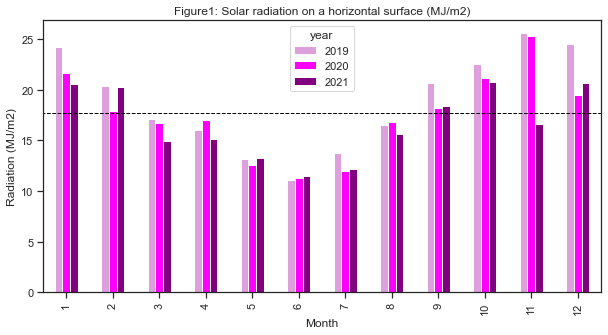

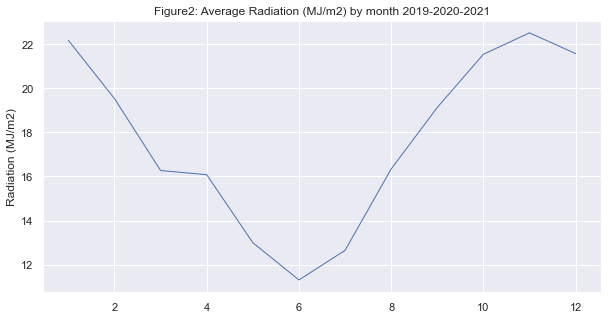

In [8]:
#Group data by month
data["Date"] = pd.to_datetime(data[["year", "month"]].assign(DAY=1))
data_month = data[['date','radiation']].groupby('date', sort=True).sum()
data_month[:10]

# Bar plot
sns.set_style("ticks")
rainfall_plot = data_pivot.drop(columns=['average'])
rainfall_plot.plot(kind="bar", figsize=(10,5), title="Figure1: Solar radiation on a horizontal surface (MJ/m2)", xlabel="Month", ylabel="Radiation (MJ/m2)",
               color=['plum', 'magenta', 'purple'])

plt.hlines((round(descr['average'][1],2)),-1,12,colors="black", linewidth=1, label='mean',linestyle='dashed')
print("Black line: Annual average of radiation: " + str(round(descr['average'][1],2)) + " (MJ/m2)")
plt.show()

# Plot the monthly average of rainfall 
sns.set(rc={'figure.figsize':(10,5)})
plt.plot(data_pivot["average"], linewidth=1)
plt.ylabel('Radiation (MJ/m2)')
plt.title('Figure2: Average Radiation (MJ/m2) by month 2019-2020-2021',size=12)
plt.show()


- `First plot`: solar radiation is grouped by year and month. Moreover, it is added the mean of radiation which differentiate two division. The first one is the solar radiation above the mean during the months from September to February. The second is solar radiation below the mean throughout the months from March to August. 

- `Second plot`: it displays the trend of solar radiation with peak in January and November and the lowest values in June.

Also, it can be plotted a boxplot to observe the distribution of some variables:

Text(0.5, 1.0, 'Figure3: Boxplot of variables')

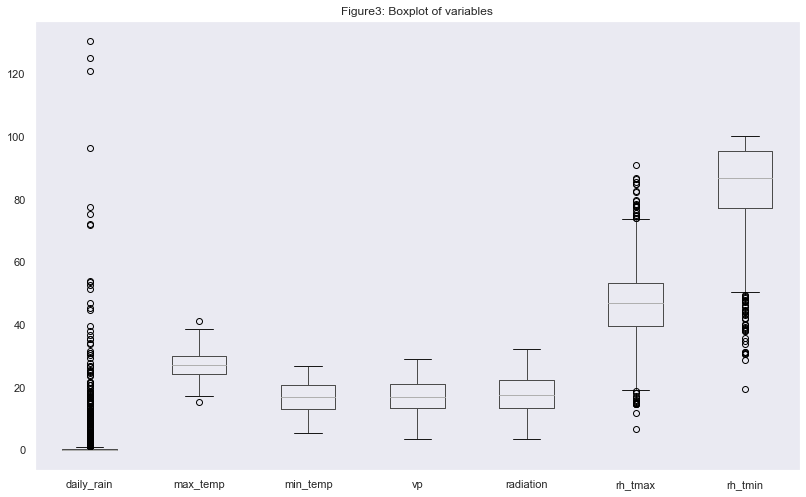

In [9]:
sns.set(rc={'figure.figsize':(13.7,8.27)})
df_Brisbane.boxplot(column=['daily_rain', 'max_temp', 'min_temp', 'vp', 'radiation',
       'rh_tmax', 'rh_tmin'], grid=False).set_title('Figure3: Boxplot of variables')

It can be observed outliers in rain, temperature, and humidity variables. Likewise, the variable `radiation` do not have any outlier.

**2. Advanced analysis of solar radiation**

Using more advanced analysis it is possible to obtain deeper knowledge about characteristic of solar radiation. For example, *`What is the prediction of radiation for the next years?`* or *`Which variables or features can cause high or low solar radiation in Brisbane?`*

**Step_1: Correlation Matrix**

Correlation between variables is a initial point to search for features causing the levels of solar radiation.


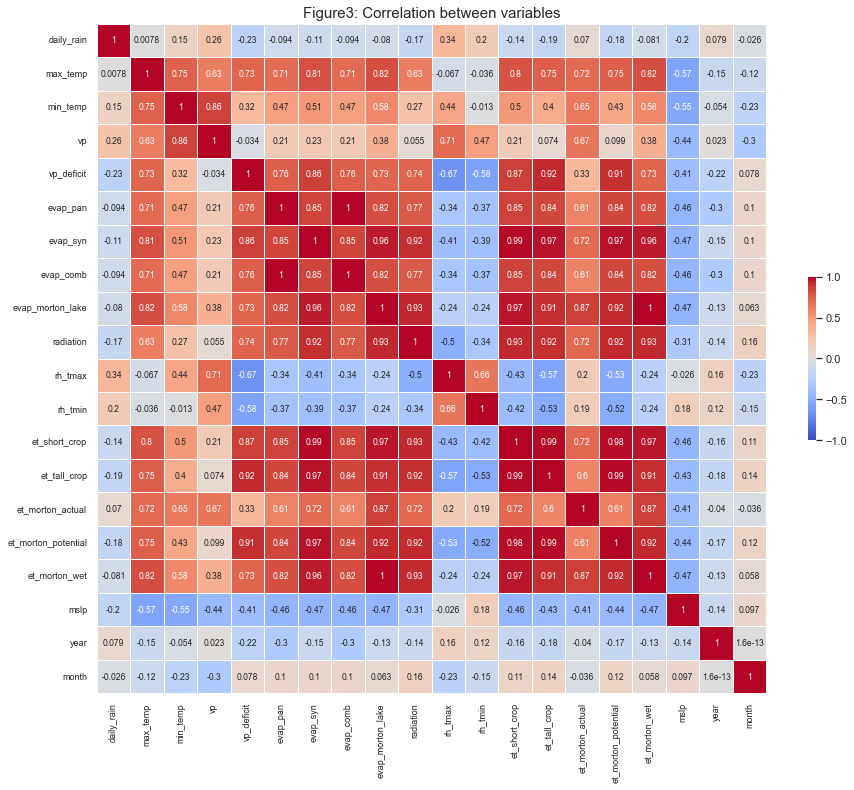

In [10]:
# Plot correlation to identify potential input variables 
data = df_Brisbane
sns.set(style='white')
correlation_matrix = data.corr()

mask = np.zeros_like(correlation_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = False

f, ax = plt.subplots(figsize=(15,15))

cmap = sns.diverging_palette(10,220, as_cmap=True)

ax = sns.heatmap(correlation_matrix, mask=mask, 
                 cmap='coolwarm', vmin=-1, vmax= 1, annot=True, annot_kws= {'size':8.5}, 
                 square=True, xticklabels=True, yticklabels=True, linewidths=.5, 
                 cbar_kws={'shrink': .2}, ax=ax)

ax.set_title('Figure3: Correlation between variables', fontsize=15)
ax.set_xticklabels(correlation_matrix.columns, fontsize=9)
ax.set_yticklabels(correlation_matrix.columns, fontsize=9);

Using the correlation between variable `radiation` and the other variables, it will be selected the correlation greater and equal to `0.35` in order to use these final variables in the model of prediction.


**correlation <= 0.35**: 
- `daily_rain` 
- `min_temp`
- `vp`
- `rh_tmin`
- `mslp`

**Variables of time**: `date`, `year` and `month` are not of interest to the model of prediction.

**Derived and redundants variables**: `evap_pan`, `evap_syn`, `et_short_crop`, `et_tall_crop`, `et_morton_potential`, `evap_morton_lake`, `et_short_crop`, `et_morton_actual`

*Hence, the following variables will be dropped: `'date', 'daily_rain','min_temp', 'vp','rh_tmin','mslp','year','month', 'Date', 'evap_pan', 'evap_syn', 'et_short_crop', 'et_tall_crop', 'et_morton_potential', 'evap_morton_lake', 'et_short_crop', 'et_morton_actual'`*

In [11]:
df_Brisbane = data.drop(['date', 'daily_rain','min_temp', 'vp','rh_tmin','mslp','year','month', 'Date', 
                        'evap_pan', 'evap_syn', 'et_short_crop', 'et_tall_crop', 'et_morton_potential', 
                         'evap_morton_lake', 'et_short_crop', 'et_morton_actual'],
                               axis=1)


**Step_2: data preparation for prediction of classifcation of level of radiation.**

In [12]:
df_Brisbane.head(4)

,max_temp,vp_deficit,evap_comb,radiation,rh_tmax,et_morton_wet
0,31.6,21.3,8.9,26.5,42.4,7.1
1,31.1,20.0,8.2,28.3,42.3,7.4
2,29.4,12.4,6.0,18.2,58.1,5.2
3,30.1,18.2,8.4,19.8,46.9,5.5


The variable `radiation` will be classified according to its quartiles because:
- Variable radiation does not show any signal of outliers.
- The identification of two notorious sides of solar radiation: high: Sep-Feb and low: March-Aug, it clarified that the level of radiation is different according to the months of the year, and it is also likely that the correlation of variables is different for each period. Therefore, dividing the data by quartiles will enable to obtain more precision in the model of prediction and to determine the feature importance.


In [13]:
# get quartiles of the radiation variable
df_quartiles = df_Brisbane.quantile([.1, .25, .5, .75], axis = 0)

# reset inder
df_quartiles.reset_index(inplace=True)

# assign quartiles with one decimal
q1 = round(df_quartiles['radiation'][1],1)
q2 = round(df_quartiles['radiation'][2],1)
q3 = round(df_quartiles['radiation'][3],1)

Each quartile will be defined as: 
- q1 = low radiation
- q2 = moderate radiation
- q3 = high radiation
- q4 = extreme radiation

In [14]:
# Split data according to the quartiles of the radiation variable
PE_Conditions = [(df_Brisbane['radiation'] < q1), 
                 (df_Brisbane['radiation'] >= q1) & (df_Brisbane['radiation'] < q2),
                (df_Brisbane['radiation'] >= q2) & (df_Brisbane['radiation'] < q3),
                (df_Brisbane['radiation'] >= q3)]

PE_Categories = ['low', 'moderate', 'high', 'extreme']

# Create `Target` variable and assign the level of radiation
df_Brisbane['Target'] = np.select(PE_Conditions, PE_Categories)

In [15]:
df_Brisbane.head(10)

,max_temp,vp_deficit,evap_comb,radiation,rh_tmax,et_morton_wet,Target
0,31.6,21.3,8.9,26.5,42.4,7.1,extreme
1,31.1,20.0,8.2,28.3,42.3,7.4,extreme
2,29.4,12.4,6.0,18.2,58.1,5.2,high
3,30.1,18.2,8.4,19.8,46.9,5.5,high
4,30.9,15.3,7.5,26.7,52.4,7.2,extreme
5,31.3,20.4,7.5,22.1,45.5,6.2,high
6,30.1,14.0,5.8,13.8,58.6,4.4,moderate
7,29.9,13.0,3.9,13.5,59.0,4.2,moderate
8,29.8,16.0,5.0,11.6,52.5,3.8,low
9,31.0,15.7,7.0,19.3,56.1,5.8,high


It is essential for classification prediction to verify the balance of data after splitting.

In [16]:
# get target variable
class_var = 'Target'

# Checking Class Balance
df_Brisbane.groupby(class_var).count()

,max_temp,vp_deficit,evap_comb,radiation,rh_tmax,et_morton_wet
Target,,,,,,
extreme,280,280,280,280,280,280
high,269,269,269,269,269,269
low,274,274,274,274,274,274
moderate,273,273,273,273,273,273


Looking the distribution, there is not any problem with the balance of the data

Next steps show the inputs and output to the model. First, it is selected the input and output variables. Second, the target variable will be changed from the four class labels (low, moderate, high and extreme) into numerical (1,0). Third, input or independent variables will be convert into matrix. Finally, data is separated into training, test and validation sets.

In [17]:
data = df_Brisbane
data_selection = data[['max_temp', 'vp_deficit',
                       'evap_comb','rh_tmax',  
                       'et_morton_wet', 'Target']]

# Select input features
feature_names = data_selection.columns[:-1]

# Define input and output
class_var = 'Target'
X = data[feature_names]
y = data[class_var]
y[0:10]

# get an array with the unique class labels
labels = data[class_var].unique()

# general info 
n_features = len(feature_names)
n_samples = data.shape[0] 
n_classes = len(labels)

# create numerical encoding for each attribute
enc = OneHotEncoder()
Y = enc.fit_transform(y[:, np.newaxis]).toarray()
Y[0:10,:]

# Convert to matrix
X_array = X.to_numpy()

# separate data into training (70%), validation (15%) and testset (15%)
X_train, X_test, Y_train, Y_test = train_test_split(X_array, Y, test_size=0.3, random_state = 515)
X_validation, X_test, Y_validation, Y_test = train_test_split(X_test, Y_test, test_size=0.5, random_state = 515)

print("There are a total of %d training instances, %d features and a total of %d classes\n" %(n_samples, n_features, n_classes))


There are a total of 1096 training instances, 5 features and a total of 4 classes



C:\Users\jacos\AppData\Local\Temp/ipykernel_24628/3532064197.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  Y = enc.fit_transform(y[:, np.newaxis]).toarray()


**Step_3: Generate a model of prediction of level of solar radiation**

**Fit the model**
    
   The `model` is generated with:

    1. Layer:
    - Input layer: 12 features
    - First hidden layer: 11 neurons
    - second hidden layer: 8 neurons
    - third hidden layer: 3 neurons
    - Output layer: 4 class 

    2. Activation neurons: `tanh` and `softmax` ---> it is used `softmax` activation because this analysis 
    is multi-class classification of four labels: low, moderate, high and extreme.

    3. Epochs: 500

In [18]:
# define the Machine Learning Model: Neural Network
model_nn = Sequential()

# Architecture of neural: Adding hidden layers and Neurons
model_nn.add(Dense(9, input_dim=X_train.shape[1], activation='tanh'))
model_nn.add(Dense(7, activation='tanh'))
model_nn.add(Dense(3, activation='tanh'))
model_nn.add(Dense(n_classes, activation='softmax'))

# Minimun of loss function (error)
model_nn.compile(loss='categorical_crossentropy', optimizer='nadam', metrics=['accuracy'])

# Fit the model
history = model_nn.fit(X_train, Y_train, validation_data=(X_validation, Y_validation), epochs=500, verbose=0)

**Evaluation of the model** 

Evaluation of the model comparing the accuracy and loss.

In [19]:
# evaluate the model
_, train_acc = model_nn.evaluate(X_train, Y_train, verbose=1)
_, test_acc = model_nn.evaluate(X_test, Y_test, verbose=1)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

6/6 [==============================] - 0s 2ms/step - loss: 0.2114 - accuracy: 0.9091
Train: 0.914, Test: 0.909


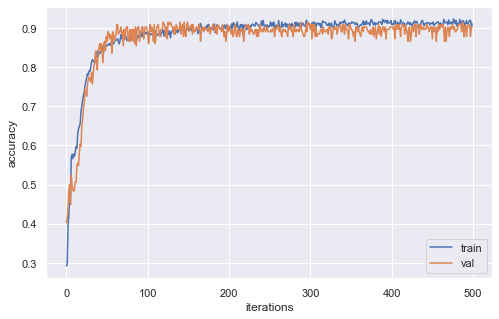

In [20]:
# plot training history (accuracy)
sns.set(rc={'figure.figsize':(8,5)})
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.ylabel('accuracy', fontsize=12)
pyplot.xlabel('iterations', fontsize=12)
pyplot.legend()
pyplot.show()

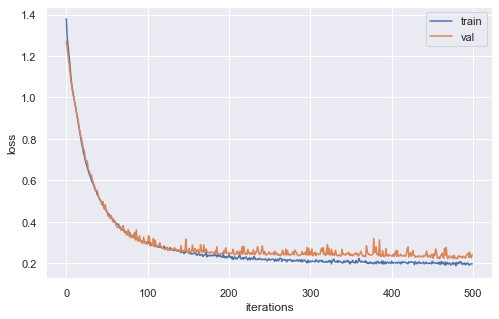

In [21]:
# plot training history (loss)
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.ylabel('loss', fontsize=12)
pyplot.xlabel('iterations', fontsize=12)
pyplot.legend()
pyplot.show()

Plots illustrate a high accuracy and low loss as well as there is not any signal of overfitting in the model.

**Confusion matrix**

6/6 [==============================] - 0s 1ms/step


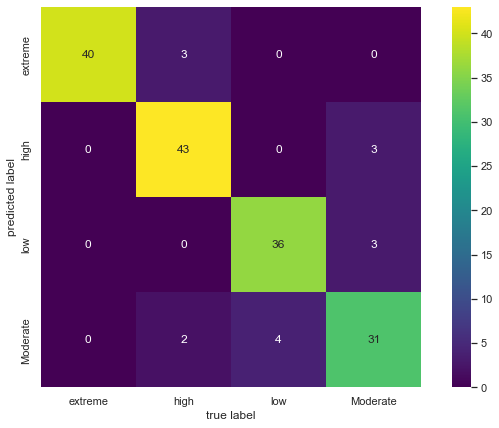

In [22]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
from matplotlib import cm

groundtruth = enc.inverse_transform( Y_test )
predictions = enc.inverse_transform( model_nn.predict( X_test ) )

mat = confusion_matrix(groundtruth, predictions)
sns.set(rc={'figure.figsize':(11,7)})
sns.heatmap(mat.T, square=True, cbar=True, xticklabels=["extreme", "high", "low", "Moderate"], \
            yticklabels=["extreme", "high", "low", "Moderate"], annot=True, cmap=cm.viridis)

plt.xlabel('true label')
plt.ylabel('predicted label');

Overall, the confusion matrix displays a good prediction of number of observations per each class label. However, there are some false predictions:

-	Two observations are predicted high, when it has to be extreme.
-	Two observations are predicted moderate, when it has to be high.
-	Five observation is predicted extreme, when it has to be high.
-	Four observations are predicted moderate, when it has to be low.
-	Two observations are predicted low, when it has to be moderate.


In [23]:
# Overal performance of the model: Classification report
from sklearn.metrics import classification_report

groundtruth = enc.inverse_transform( Y_test )
predictions = enc.inverse_transform( model_nn.predict( X_test ) )

print(classification_report(groundtruth, predictions, target_names=["extreme", "high", "low", "Moderate"]))

6/6 [==============================] - 0s 1ms/step
              precision    recall  f1-score   support

     extreme       0.93      1.00      0.96        40
        high       0.93      0.90      0.91        48
         low       0.92      0.90      0.91        40
    Moderate       0.84      0.84      0.84        37

    accuracy                           0.91       165
   macro avg       0.91      0.91      0.91       165
weighted avg       0.91      0.91      0.91       165



- The accuracy of the model is around 90% which can be deemed a proper estimation of solar radiation.
- The loss is around 20% which could be better, but it appears to be not a strong problem.
- It could de regarded a model without problems of overfitting and underfitting.


**Step_4: Explanation of the model of prediction**


In [24]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names= feature_names, 
                                              class_names=["extreme", "high", "low", "Moderate"], 
                                              verbose=False, mode='classification')

#### True prediction:

#### a. Explain weather #109: Low radiation prediction

In [25]:
# Top 5 selected number of features
MAX_FEAT = 5

# First index
weather_indx = 109

# Fix values
weather_feat = X_array[weather_indx,:]
weather_true_pred = enc.inverse_transform(np.expand_dims(Y[weather_indx,:], 0))[0][0][0][0]
groundtruth = y[weather_indx]

# prediction
pred = model_nn.predict(np.expand_dims(weather_feat, 0))
pred = enc.inverse_transform( pred )[0][0][0][0]

1/1 [==============================] - 0s 17ms/step


157/157 [==============================] - 0s 940us/step


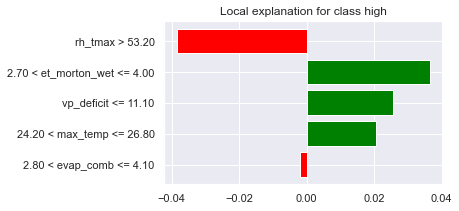

In [26]:
# Explain instance
exp = explainer.explain_instance(weather_feat, model_nn.predict, num_features= MAX_FEAT, top_labels=4)

# Show the prediction low radiation
exp.show_in_notebook(show_table=True)
plt.show()

# Top5: Feature importance of prediction low radiation
sns.set(rc={'figure.figsize':(5,3)})
explanation_plot = exp.as_pyplot_figure()
plt.show()

In this observation the probability of being low radiation is 99%. The feature importance shows that when the combination of evapotranspiration, maximum temperature and humidity are low, the probability of solar radiation is also low. 

#### b. Explain weather #103: Moderate radiation prediction

In [27]:
# Top 5 selected number of features
MAX_FEAT = 5

# First index
weather_indx = 103

# Fix values
weather_feat = X_array[weather_indx,:]
weather_true_pred = enc.inverse_transform(np.expand_dims(Y[weather_indx,:], 0))[0][0][0][0]
groundtruth = y[weather_indx]

# prediction
pred = model_nn.predict(np.expand_dims(weather_feat, 0))
pred = enc.inverse_transform( pred )[0][0][0][0]

1/1 [==============================] - 0s 16ms/step


157/157 [==============================] - 0s 1ms/step


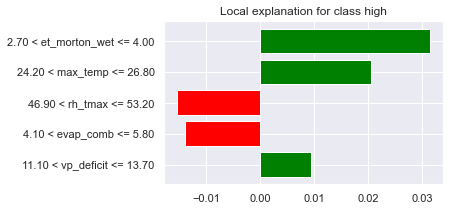

In [28]:
# Explain instance
exp = explainer.explain_instance(weather_feat, model_nn.predict, num_features= MAX_FEAT, top_labels=4)

# Show the prediction low radiation
exp.show_in_notebook(show_table=True)
plt.show()

# Top5: Feature importance of prediction low radiation
explanation_plot = exp.as_pyplot_figure()
plt.show()

In this observation the probability of being moderate radiation is 98%. The feature importance shows that when the combination of evapotranspiration, vaporisation and evaporisation are low, the probability of solar radiation is also moderate. 

#### c. Explain weather #107: High radiation prediction

It will be attempted the analyse how the model reach this prediction.
It will take two prediction: observation weather #100 and #880 in order to observe the prediction probability per each class label as well as obtaining the importance of input variable to get this prediction.


In [29]:
# Top 5 selected number of features
MAX_FEAT = 5

# First index
weather_indx = 107

# Fix values
weather_feat = X_array[weather_indx,:]
weather_true_pred = enc.inverse_transform(np.expand_dims(Y[weather_indx,:], 0))[0][0][0][0]
groundtruth = y[weather_indx]

# prediction
pred = model_nn.predict(np.expand_dims(weather_feat, 0))
pred = enc.inverse_transform( pred )[0][0][0][0]

1/1 [==============================] - 0s 16ms/step


157/157 [==============================] - 0s 921us/step


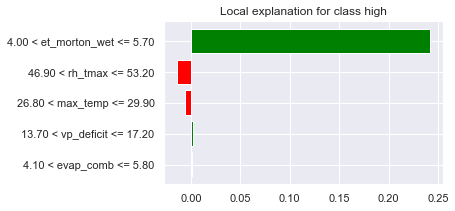

In [30]:
# Explain instance
exp = explainer.explain_instance(weather_feat, model_nn.predict, num_features= MAX_FEAT, top_labels=4)

# Show the prediction low radiation
exp.show_in_notebook(show_table=True)
plt.show()

# Top5: Feature importance of prediction low radiation
explanation_plot = exp.as_pyplot_figure()
plt.show()

As it can be seen in the above plots, the weather observation number 107 has a 96% of probability of being high solar radiation , it means values between 17.4 and 22.4 MJ/m2. 

Furthermore, the feature importance depicts that evapotranspiration ahave a big impact in the high radiation class label


#### d. Explain weather #39: Extreme radiation prediction

In [31]:
# Top 5 selected number of features
MAX_FEAT = 5

# First index
weather_indx = 325

# Fix values
weather_feat = X_array[weather_indx,:]
weather_true_pred = enc.inverse_transform(np.expand_dims(Y[weather_indx,:], 0))[0][0][0][0]
groundtruth = y[weather_indx]

# prediction
pred = model_nn.predict(np.expand_dims(weather_feat, 0))
pred = enc.inverse_transform( pred )[0][0][0][0]

1/1 [==============================] - 0s 21ms/step


157/157 [==============================] - 0s 921us/step


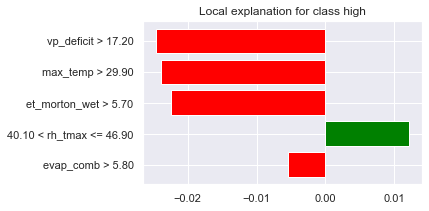

In [32]:
# Explain instance
exp = explainer.explain_instance(weather_feat, model_nn.predict, num_features= MAX_FEAT, top_labels=4)

# Show the prediction low radiation
exp.show_in_notebook(show_table=True)
plt.show()

# Top5: Feature importance of prediction low radiation
explanation_plot = exp.as_pyplot_figure()
plt.show()

In this observation the probability of being extreme radiation is 100%. Evapotranspiration contribute to this class label with 67%

### False prediction

#### a. Explain weather #217: high and moderate radiation prediction

In [35]:
# Top 5 selected number of features
MAX_FEAT = 5

# First index
weather_indx = 217

# Fix values
weather_feat = X_array[weather_indx,:]
weather_true_pred = enc.inverse_transform(np.expand_dims(Y[weather_indx,:], 0))[0][0][0][0]
groundtruth = y[weather_indx]

# prediction
pred = model_nn.predict(np.expand_dims(weather_feat, 0))
pred = enc.inverse_transform( pred )[0][0][0][0]

1/1 [==============================] - 0s 18ms/step


157/157 [==============================] - 0s 869us/step


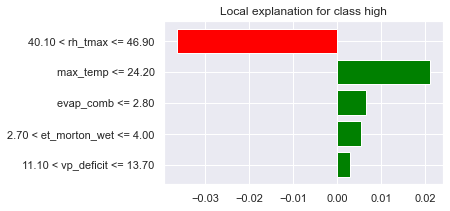

In [36]:
# Explain instance
exp = explainer.explain_instance(weather_feat, model_nn.predict, num_features= MAX_FEAT, top_labels=4)

# Show the prediction low radiation
exp.show_in_notebook(show_table=True)
plt.show()

# Top5: Feature importance of prediction low radiation
explanation_plot = exp.as_pyplot_figure()
plt.show()

#### b. Explain weather #118: moderate and low radiation prediction

In [37]:
# Top 5 selected number of features
MAX_FEAT = 5

# First index
weather_indx = 118

# Fix values
weather_feat = X_array[weather_indx,:]
weather_true_pred = enc.inverse_transform(np.expand_dims(Y[weather_indx,:], 0))[0][0][0][0]
groundtruth = y[weather_indx]

# prediction
pred = model_nn.predict(np.expand_dims(weather_feat, 0))
pred = enc.inverse_transform( pred )[0][0][0][0]

1/1 [==============================] - 0s 17ms/step


157/157 [==============================] - 0s 1ms/step


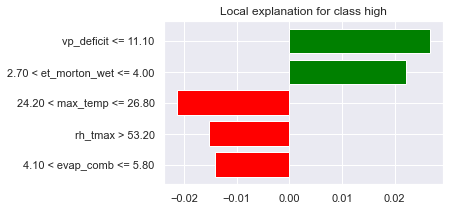

In [38]:
# Explain instance
exp = explainer.explain_instance(weather_feat, model_nn.predict, num_features= MAX_FEAT, top_labels=4)

# Show the prediction low radiation
exp.show_in_notebook(show_table=True)
plt.show()

# Top5: Feature importance of prediction low radiation
explanation_plot = exp.as_pyplot_figure()
plt.show()

These false predictions support the matrix correlation that there are some wrong predictions. 

---
#### Description of the critical analysis

Weather conditions (inputs): 
- `vp_deficit`: vaporisation (hpa) 
- `max_temp`: maximun temperature (0c)
- `evap_comb`: evaporisation (mm)
- `rh_tmax`: humidity in maximun temperature (%)
- `et_morton_wet`: Evapotranspiration (mm)

It can be summarized some insights from the `Lime` analysis

|Obs. |status    | prediction       |%          | Feature  |value                      |Contribution|
|-----|----------|------------------|-----------|----------|---------------------------|------------|
|#109 |True      |Low               |99%        |rh_tmax   |between 53.20 and 71.10    |28%         |
|     |          |                  |           |et_morton |between 2.70 and 4.00      |11%         | 
|     |          |                  |           |vp_deficit|between 6.60 and 11.10     |-25%        |
|#103 |True      |Moderate          |98%        |et_morton |between 2.70 and 3.70      |19%         |
|     |          |                  |           |vp_deficit|between 11.10 and 17.70    |4%          | 
|     |          |                  |           |evap_comb |between 4.10 and 5.80      |2%          |
|#107 |True      |High              |96%        |et_morton |between 4.00 and 5.70      |24%         |
|     |          |                  |           |hr_tmax   |between 46.9 and 53.20     |-1%         | 
|     |          |                  |           |vp_deficit|between 13.70 and 17.20    |1%          |
|#325 |True      |Extreme           |100%       |rh_tmax   |between 40.10 and 46.90    |-5%         |
|     |          |                  |           |et_morton |between 5.70 and 7.40      |67%         | 
|     |          |                  |           |vp_deficit|between 13.70 and 17.20    |-22%        |
|#217 |False     |Moderate and high |57% and 46%|et_morton |between 2.70 and 4.00      |18%         |
|     |          |                  |           |vp_deficit|between 11.10 and 13.70    |4%          | 
|#118 |False     |Moderate and low  |54% and 46%|et_morton |between 2.70 and 4.00      |17%         |
|     |          |                  |           |vp_deficit|between 9.30 and 11.10.    |5%          |
|     |          |                  |           |rh_tmax   |between 53.20 and 59.80    |-%          |
 
##### True prediction:
- Observations #109 has a prediction of low radiation. The feature which provides more contribution is humidity and evapotranspiration. Furthemore, vaporisation provides a negative contribution, it means that this feature could provide a positive contribution when radiation is higher.
- In Observations #103, #107, and #325 can be seen that the most important feature is evaportranspiration. Bigger this feature is equal to more solar radiation. Likewise, when vaporisation is increase the solar radiation as well.

##### False prediction:
- Observations #217 and #118 are false prediction because the range of values can be found in the same class label. For example, evapotranspiration feature can has the same range of values in low, moderate and high from 2.70 to 5.70.

#### 4.4. Detail of insight

This analysis focused on level of solar radiation in MJ/m2 throughout the period from 2019 to 2021 in the city of Brisbane.

**Summary from foundational analysis**

- The months with highest solar radiation are those between September and February. 
- The months with lowest solar radiation are those between September and February. 
- Peak of radiation appear in November and January.
- The lowest of solar radiation is June.
- The mean of radiation is around 17 MJ/m2 per year.
- The minimum value of radiation is around 11 MJ/m2 per year.
- The maximum value of radiation is around 24 MJ/m2 per year.
- With the previous information, the variable radiation was classified according to its quartiles in low, moderate, high and extreme radiation in Brisbane.

|Quartile   | Level    | Radiation (MJ/m2)    |
|-----------|----------|----------------------|
|Q1         |Low       | <13.3                |
|Q2         |Moderate  | >=13.3 & <17.4       |
|Q3         |High      | >=17.4 & <22.4       |
|Q4         |Extreme   | >=22.4               |


**Summary from advanced analysis**

- Variables `max_temp`, `vp_deficit`, `evap_comb`, `rh_tmax`, `et_morton_wet` have a strong correlation with variable `radiation`.
- The model of prediction obtained an accuracy above 85% and a loss around 25%. Confusion matrix detailed the wrong prediction. However, there were not any issues of overfitting and underfitting.
- The combination and the variability of `max_temp`, `vp_deficit`, `evap_comb`, `rh_tmax`, `et_morton_wet` contribute to the level of solar radiation. The variable `et_morton_wet` has the most significant contribution.
- Varibale `max_temp` shows a positive contribuition from high solar radiation.
- humidity does not provide a strong contribution.

**Conclusions**
- Two clear period was identified: highest radiation: Sep-Feb and lowest radiation: March-Aug
- Despite not having any outlier in the variable `radiation`, it could be inferred the levels of solar radiation using the quartiles. Outliers could be a good advantage to have more liable classification of solar radiation. 
- Rainfall does not have either positive or negative impact in solar radiation.
- Evapotranspiration and temperature features lead to high and extreme radiation.

---
### 5. Risk of the analysis <a name="question5"></a>

##### 1. Stakeholders interest
This analysis provides meaningful insight about the levels of solar radiation. This is mainly deemed in the identification of four levels of solar radiation with certain weather conditions. The most important stakeholders for this anaylysis are two department authorities. First, the Department of Environment and Science of Queensland may take some decisions and solution using this analysis. The increase of solar radiation can be beneficial to be used as renewable energy. The other The Department is health. In order to prevent the increase of people with cancer, the health department would promote a campaign to reduce the exposition of citizens to the solar radiation. 

##### 2. Impact of the model of prediction
The care of the environment is currently of great concern. The increase of utilization of renewable energy is primordial to replace the consumption of non-renewable energy. The prediction of solar radiation for the next years is pivotal to plan the installation of solar panels around Brisbane. This may lead to improve environmental care. Moreover, health skin disease is another important problem. This can be seen with the increase of cancer disease due to hight radiation. Authorities could use this model of prediction to take some actions in order to reduce the exposition of people to high radiation, such as: campaign conscientization of risk of exposition to solar radiation, implementation of point of shadow, improve quality of sunscreens.

Moreover, there could be a negative impact if this model of prediction is failed. According to the confusion matrix and Lime explicability, this model could fail or have a false prediction due to the fact that the classification of levels was carried out using quartiles, which provided the range of solar radiation. Therefore, some predictions lead to wrong predictions because certain values were close to one classifier each other. For example, some prediction could be high or moderate and other could be low or moderate. This is because the range of radiation was defined empirically using the quartiles. 

Could be this model generalized? This question is essential to define the usability of this model. This model of prediction of solar radiation could fail due to the variety of climatic condition of each region. Because the weather in Brisbane has a tropical condition, this model may lead to false prediction in other regions with different weather condition. For example, this model could fail and not be generalized in Canada due to its different climatic conditions. Therefore, this application boundary of the model is defined by the type of weather for each region.

##### 3. Risk
- The correct prediction of solar radiation could prevent risk of health and also to improve the environmental care. However, if this model is wrong, stakeholders could waste time and money due to the inversion of solution to mitigate the impact of solar radiation. Furthermore, if the model predicted low radiation instead of predicting high radiation, citizens would be exposed to high solar radiation.

- If well Authorities foster the installation of solar panels, it is usually sold by business. Therefore, a bad model of prediction could cause that business to advise erroneously the citizen. For example, if the model predicted that there will be an increase of solar radiation in the next years and this values it is wrong, citizens could buy this product and waste their money.


##### 4. Bias
- This analysis was performed only using the data of one station rainfall located in Brisbane centre. Also, this ubication is close to the coastal.  
- The climate change is a complex issue nowadays. Due to this, the usability in the time of this data could be erroneous because it can be an increase in solar radiation and the model would keep the same levels of solar radiation.
- The model has a high accuracy, but the loss is around 25%. It is likely that some other features or variables must be incorporated in order to enhance these issues.
- The empirical definition of levels of solar radiation using the quartiles could be an issue if this model was to deploy.
- It could be not applied in other countries or regions due to the variety of climates with different patterns. 

##### 5. Ethics
- If Business knew or had access to this model of prediction solar radiation, they could take advantage to increase the price of solar panels. Hence, the access and responsibility of this model must be only of governmental authorities. 